<p style="text-align:center;"><span style="font-size:50px;"><span style="color:Wheat;"><span style="font-family:cursive;"> Bank Customers Classification ! </span> </span>  </span></p>

<div style="padding: 30px; background-color: Silver; margin: 0; color: RosyBrown; font-family: cursive, serif; font-size: 100%; text-align: center; border-radius: 10% / 50%; overflow: hidden; font-weight: 500;">
    <p>There is a  dataset with thousands of a bank customers and some of their information.</p>
    <p>Also there is a column named personal loan which have a binary categorization and it stores the customers information, if they got loan before or not.</p>
    <p>In this notebook i want to train the dataset with 3 algorithms (Logistic regression - Naïve Bayes - KNN) for a recommendation goal. The purpose is : by the information that we will get from our new costumers, should we recommend loans to them or not ?</p>
</div>

# <div style="padding: 10px; background-color: Thistle; margin: 0; color: Teal; font-family: cursive, serif; font-size: 120%; text-align: center; border-radius: 50% 20% / 10% 40%;; overflow: hidden; font-weight: 500;">importing libraries and data </div>

In [1]:
import numpy as np                    # import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

from uszipcode import SearchEngine       # a library for extracting information form zip code
from geopy.geocoders import Nominatim    # libraries for extracting information form lat & long
from geopy.exc import GeocoderTimedOut
import warnings                          # for ignoring warnings

warnings.simplefilter (action = 'ignore')

C:\Users\hameddlv24\anaconda3\lib\site-packages\fuzzywuzzy\fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


In [2]:
from sklearn.model_selection import train_test_split    # for train & test
from sklearn import metrics                             # for metrics
from sklearn.preprocessing import StandardScaler        # for Scalling
from sklearn.model_selection import GridSearchCV        # for improving model
from sklearn.model_selection import KFold               # for cross validation
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression     # for logistic regression model
from sklearn.metrics import classification_report , confusion_matrix  
from sklearn.naive_bayes import GaussianNB               # for naive bayes model (Gaussian)
from sklearn.naive_bayes import MultinomialNB            # for naive bayes model (Multinomial)
from sklearn.naive_bayes import ComplementNB             # for naive bayes model (Complement)
from sklearn.naive_bayes import BernoulliNB              # for naive bayes model (Bernoulli)
from sklearn.neighbors import KNeighborsClassifier       # for KNN algorithm

In [3]:
# import and data frame the data set
data = pd.read_csv ("Bank_Personal_Loan_Modelling.csv")
df = pd.DataFrame (data)
df

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,1,25,1,49,91107,4,1/60,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,1/50,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,1/00,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,2/70,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,1/00,2,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,29,3,40,92697,1,1/90,3,0,0,0,0,1,0
4996,4997,30,4,15,92037,4,0/40,1,85,0,0,0,1,0
4997,4998,63,39,24,93023,2,0/30,3,0,0,0,0,0,0
4998,4999,65,40,49,90034,3,0/50,2,0,0,0,0,1,0


# <div style="padding: 10px; background-color: Thistle; margin: 0; color: Teal; font-family: cursive, serif; font-size: 120%; text-align: center; border-radius: 50% 20% / 10% 40%;; overflow: hidden; font-weight: 500;">PreProcessing</div>

In [4]:
df.describe ().T

,count,mean,std,min,25%,50%,75%,max
ID,5000.0,2500.5000,1443.520003,1.0,1250.75,2500.5,3750.25,5000.0
Age,5000.0,45.3384,11.463166,23.0,35.00,45.0,55.00,67.0
Experience,5000.0,20.1046,11.467954,-3.0,10.00,20.0,30.00,43.0
Income,5000.0,73.7742,46.033729,8.0,39.00,64.0,98.00,224.0
ZIP Code,5000.0,93152.5030,2121.852197,9307.0,91911.00,93437.0,94608.00,96651.0
Family,5000.0,2.3964,1.147663,1.0,1.00,2.0,3.00,4.0
Education,5000.0,1.8810,0.839869,1.0,1.00,2.0,3.00,3.0
Mortgage,5000.0,56.4988,101.713802,0.0,0.00,0.0,101.00,635.0
Personal Loan,5000.0,0.0960,0.294621,0.0,0.00,0.0,0.00,1.0
Securities Account,5000.0,0.1044,0.305809,0.0,0.00,0.0,0.00,1.0


In [5]:
df.info ()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   ID                  5000 non-null   int64 
 1   Age                 5000 non-null   int64 
 2   Experience          5000 non-null   int64 
 3   Income              5000 non-null   int64 
 4   ZIP Code            5000 non-null   int64 
 5   Family              5000 non-null   int64 
 6   CCAvg               5000 non-null   object
 7   Education           5000 non-null   int64 
 8   Mortgage            5000 non-null   int64 
 9   Personal Loan       5000 non-null   int64 
 10  Securities Account  5000 non-null   int64 
 11  CD Account          5000 non-null   int64 
 12  Online              5000 non-null   int64 
 13  CreditCard          5000 non-null   int64 
dtypes: int64(13), object(1)
memory usage: 547.0+ KB


<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">There is a problem in CCAvg column. Its data type is object and the decimal point in this columns is '/' that we should replace it with '.'</div>

In [6]:
df['CCAvg'] = df['CCAvg'].str.replace('/', '.') # replacing '/' with '.' 

In [7]:
df["CCAvg"]

0       1.60
1       1.50
2       1.00
3       2.70
4       1.00
        ... 
4995    1.90
4996    0.40
4997    0.30
4998    0.50
4999    0.80
Name: CCAvg, Length: 5000, dtype: object

In [8]:
df["CCAvg"] = df["CCAvg"].astype ("float" )  # changing data type

In [9]:
df.describe ().T

,count,mean,std,min,25%,50%,75%,max
ID,5000.0,2500.500000,1443.520003,1.0,1250.75,2500.5,3750.25,5000.0
Age,5000.0,45.338400,11.463166,23.0,35.00,45.0,55.00,67.0
Experience,5000.0,20.104600,11.467954,-3.0,10.00,20.0,30.00,43.0
Income,5000.0,73.774200,46.033729,8.0,39.00,64.0,98.00,224.0
ZIP Code,5000.0,93152.503000,2121.852197,9307.0,91911.00,93437.0,94608.00,96651.0
Family,5000.0,2.396400,1.147663,1.0,1.00,2.0,3.00,4.0
CCAvg,5000.0,1.937938,1.747659,0.0,0.70,1.5,2.50,10.0
Education,5000.0,1.881000,0.839869,1.0,1.00,2.0,3.00,3.0
Mortgage,5000.0,56.498800,101.713802,0.0,0.00,0.0,101.00,635.0
Personal Loan,5000.0,0.096000,0.294621,0.0,0.00,0.0,0.00,1.0


In [10]:
df.info ()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID                  5000 non-null   int64  
 1   Age                 5000 non-null   int64  
 2   Experience          5000 non-null   int64  
 3   Income              5000 non-null   int64  
 4   ZIP Code            5000 non-null   int64  
 5   Family              5000 non-null   int64  
 6   CCAvg               5000 non-null   float64
 7   Education           5000 non-null   int64  
 8   Mortgage            5000 non-null   int64  
 9   Personal Loan       5000 non-null   int64  
 10  Securities Account  5000 non-null   int64  
 11  CD Account          5000 non-null   int64  
 12  Online              5000 non-null   int64  
 13  CreditCard          5000 non-null   int64  
dtypes: float64(1), int64(13)
memory usage: 547.0 KB


In [11]:
# looking for NAN 
df.isnull().sum()

ID                    0
Age                   0
Experience            0
Income                0
ZIP Code              0
Family                0
CCAvg                 0
Education             0
Mortgage              0
Personal Loan         0
Securities Account    0
CD Account            0
Online                0
CreditCard            0
dtype: int64

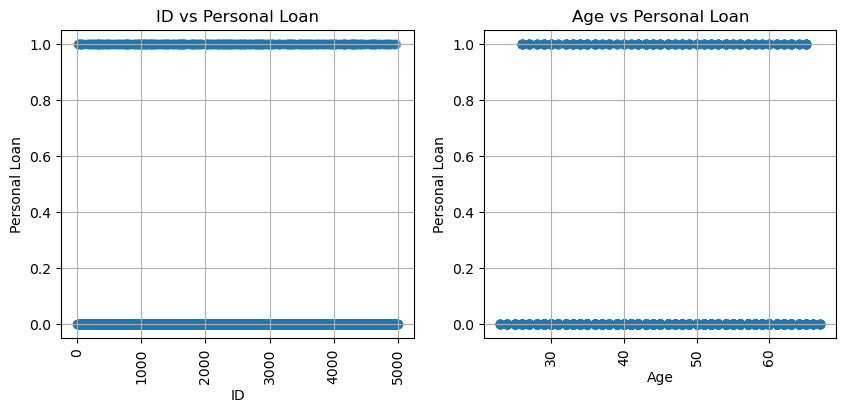

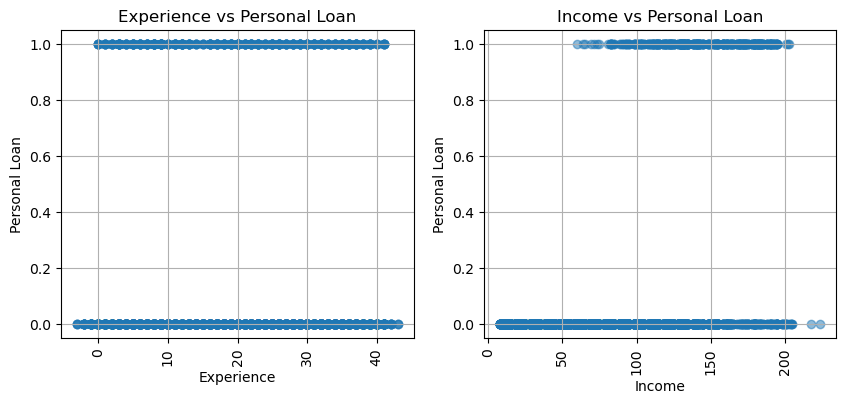

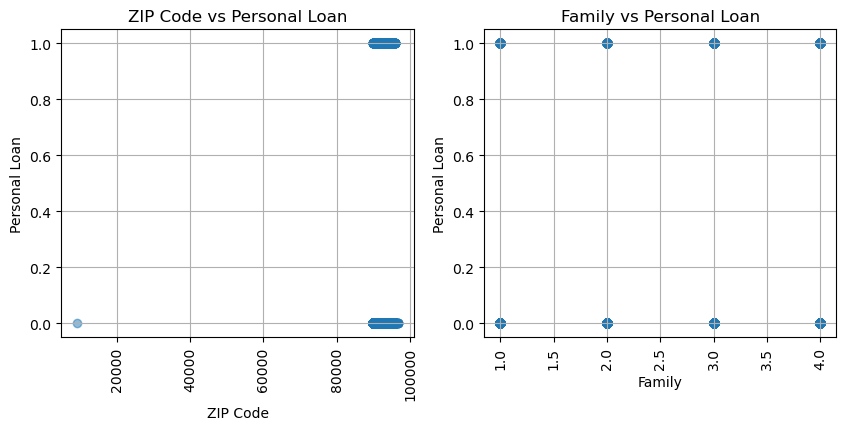

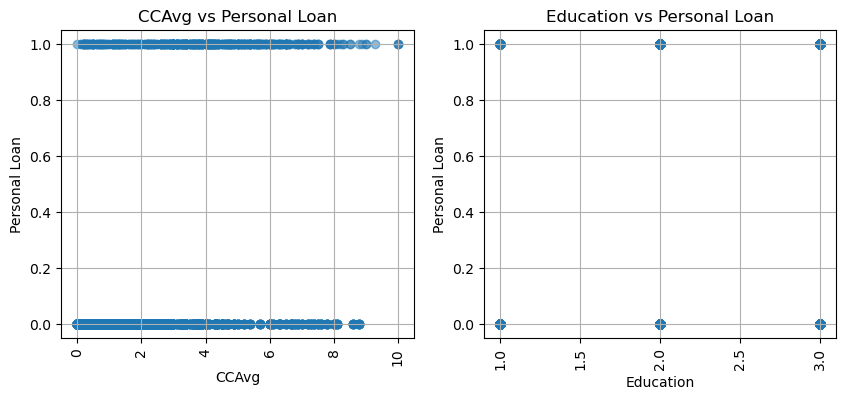

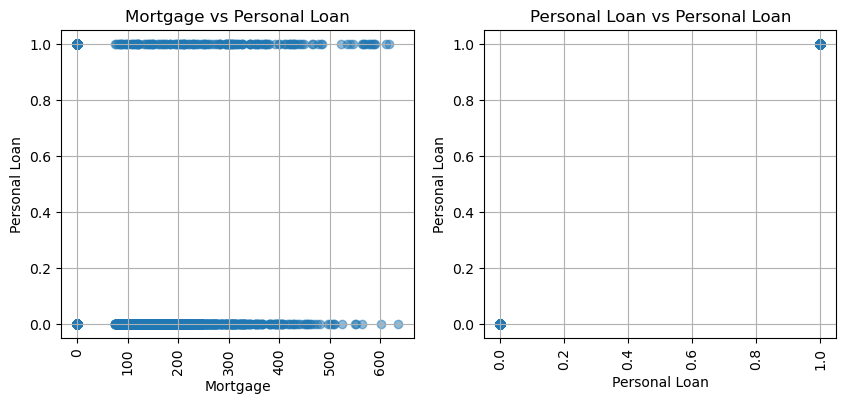

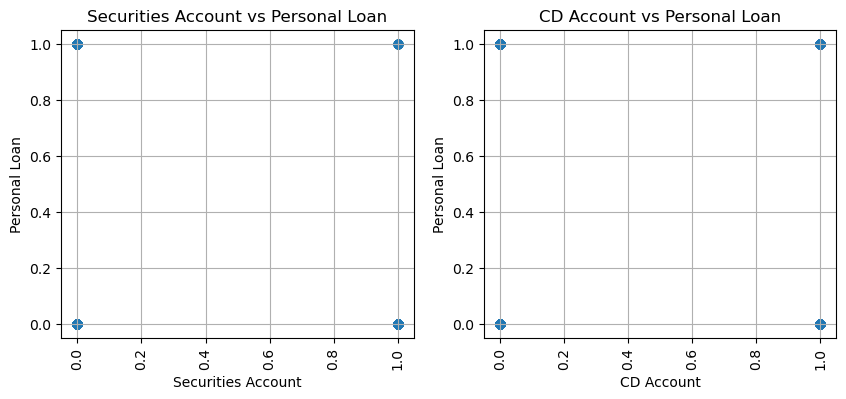

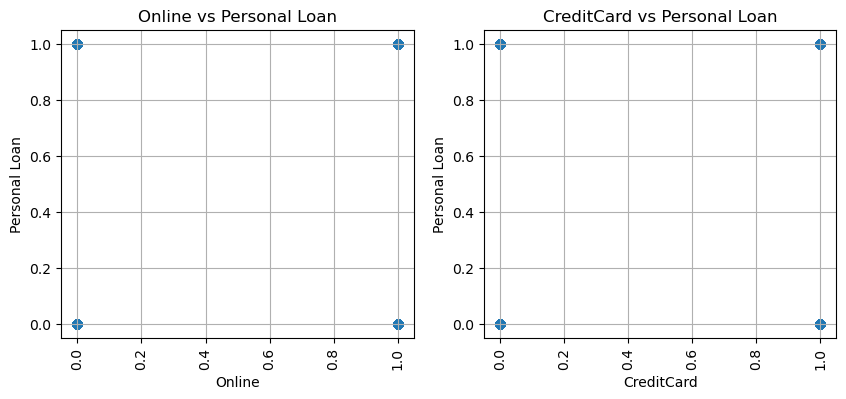

In [12]:
scatter_plot = df.columns                    # scatter plot of all columns for cheking noises
i =  0
while i < 14:
    plt.figure (figsize = [10 , 4])
    plt.subplot (1 , 2 , 1)   
    plt.scatter (df [scatter_plot [i]] , df ["Personal Loan"] , alpha = .5)
    plt.title (scatter_plot [i] + " vs Personal Loan")
    plt.xlabel (scatter_plot [i])
    plt.xticks (rotation = 90)
    plt.ylabel ("Personal Loan")
    plt.grid ()
    i += 1
    plt.subplot (1 , 2 , 2)
    plt.scatter (df [scatter_plot [i]] , df ["Personal Loan"] , alpha = .5)
    plt.title (scatter_plot [i] + " vs Personal Loan")
    plt.xlabel (scatter_plot [i])
    plt.xticks (rotation = 90)
    plt.ylabel ("Personal Loan")
    plt.grid ()
    i += 1
    plt.show ()

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">There are some suspicious data : 
<br> - exprience < 0 
<br> - zip code < 20,000
<br> lets check them ...
</div>

In [13]:
df_noise_check = df [df ["Experience"] < 0].reset_index()
df_noise_check

,index,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,89,90,25,-1,113,94303,4,2.30,3,0,0,0,0,0,1
1,226,227,24,-1,39,94085,2,1.70,2,0,0,0,0,0,0
2,315,316,24,-2,51,90630,3,0.30,3,0,0,0,0,1,0
3,451,452,28,-2,48,94132,2,1.75,3,89,0,0,0,1,0
4,524,525,24,-1,75,93014,4,0.20,1,0,0,0,0,1,0
5,536,537,25,-1,43,92173,3,2.40,2,176,0,0,0,1,0
6,540,541,25,-1,109,94010,4,2.30,3,314,0,0,0,1,0
7,576,577,25,-1,48,92870,3,0.30,3,0,0,0,0,0,1
8,583,584,24,-1,38,95045,2,1.70,2,0,0,0,0,1,0
9,597,598,24,-2,125,92835,2,7.20,1,0,0,1,0,0,1


In [14]:
df [df ["ZIP Code"] < 20000]

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
384,385,51,25,21,9307,4,0.6,3,0,0,0,0,1,1


<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">
- The zip code is 'zip4' format and it's ok
<br> - The exprience can't be negative so we transform negative samples to positive values. Also we have other options like give them '0' value or remove them from dataset. I handle it in this way though.</div>

In [15]:
df['Experience'] = df['Experience'].abs()

In [16]:
df.describe ().T

,count,mean,std,min,25%,50%,75%,max
ID,5000.0,2500.500000,1443.520003,1.0,1250.75,2500.5,3750.25,5000.0
Age,5000.0,45.338400,11.463166,23.0,35.00,45.0,55.00,67.0
Experience,5000.0,20.134600,11.415189,0.0,10.00,20.0,30.00,43.0
Income,5000.0,73.774200,46.033729,8.0,39.00,64.0,98.00,224.0
ZIP Code,5000.0,93152.503000,2121.852197,9307.0,91911.00,93437.0,94608.00,96651.0
Family,5000.0,2.396400,1.147663,1.0,1.00,2.0,3.00,4.0
CCAvg,5000.0,1.937938,1.747659,0.0,0.70,1.5,2.50,10.0
Education,5000.0,1.881000,0.839869,1.0,1.00,2.0,3.00,3.0
Mortgage,5000.0,56.498800,101.713802,0.0,0.00,0.0,101.00,635.0
Personal Loan,5000.0,0.096000,0.294621,0.0,0.00,0.0,0.00,1.0


In [17]:
# checking duplicated rows
df.duplicated().sum()

0

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">Now i want to extract city, county, lat and long informations from zip codes</div>

In [18]:
search = SearchEngine()

def get_location_and_county_from_zip(zip_code):
    zipcode = search.by_zipcode(zip_code)
    
    if zipcode is None or not zipcode.major_city or not zipcode.lat or not zipcode.lng or not zipcode.county:
        return pd.Series([np.nan , np.nan , np.nan , np.nan])
    
    return pd.Series([zipcode.major_city , zipcode.lat , zipcode.lng , zipcode.county])

df[['City' , 'Latitude' , 'Longitude' , 'County']] = df['ZIP Code'].apply(get_location_and_county_from_zip)

In [19]:
df

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard,City,Latitude,Longitude,County
0,1,25,1,49,91107,4,1.6,1,0,0,1,0,0,0,Pasadena,34.16,-118.08,Los Angeles County
1,2,45,19,34,90089,3,1.5,1,0,0,1,0,0,0,Los Angeles,34.02,-118.29,Los Angeles County
2,3,39,15,11,94720,1,1.0,1,0,0,0,0,0,0,Berkeley,37.87,-122.25,Alameda County
3,4,35,9,100,94112,1,2.7,2,0,0,0,0,0,0,San Francisco,37.72,-122.44,San Francisco County
4,5,35,8,45,91330,4,1.0,2,0,0,0,0,0,1,Northridge,34.25,-118.53,Los Angeles County
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,29,3,40,92697,1,1.9,3,0,0,0,0,1,0,Irvine,33.64,-117.84,Orange County
4996,4997,30,4,15,92037,4,0.4,1,85,0,0,0,1,0,La Jolla,32.86,-117.24,San Diego County
4997,4998,63,39,24,93023,2,0.3,3,0,0,0,0,0,0,Ojai,34.51,-119.29,Ventura County
4998,4999,65,40,49,90034,3,0.5,2,0,0,0,0,1,0,Los Angeles,34.03,-118.40,Los Angeles County


In [20]:
df.isnull().sum()

ID                     0
Age                    0
Experience             0
Income                 0
ZIP Code               0
Family                 0
CCAvg                  0
Education              0
Mortgage               0
Personal Loan          0
Securities Account     0
CD Account             0
Online                 0
CreditCard             0
City                  34
Latitude              34
Longitude             34
County                34
dtype: int64

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">There are some NAN values in new columns and it's becuase of problems in their zipcodes maybe. Lest check and handle them.  </div>

In [21]:
df_nan = df [df.isna().any (axis = 1)]  # checking zip code of nan values
df_nan ["ZIP Code"].unique ()

array([92717,  9307, 92634, 96651], dtype=int64)

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">
I found city, county, latitude and longitude of these zip codes manualy. Now i want to fill these NAN values. Their values are :
    <br> - zip code 92717 => lat : 33.64 , lon : -117.83 , city : Irvine , county : Orange County
    <br> - zip code 9307 => lat : 37.41 , lon : -120.5 , city : Merced , county : Merced County
    <br> - zip code 92634 => lat : 33.87 , lon : -117.90 , city : Fullerton , county : Orange County
    <br> - zip code 96651 => lat : 38.8 , lon : -120.9 , city : Lotus , county : El Dorado County
</div>

In [22]:
df.loc [df ['ZIP Code'] == 92717 , ['City' , 'Latitude' , 'Longitude' , 'County']] = ['Irvine' , 33.64 , -117.83 , 'Orange County']
df.loc [df ['ZIP Code'] == 9307 , ['City' , 'Latitude' , 'Longitude' , 'County']] = ['Merced' , 37.41 , -120.5 , 'Merced County']
df.loc [df ['ZIP Code'] == 92634 , ['City' , 'Latitude' , 'Longitude' , 'County']] = ['Fullerton' , 33.87 , -117.90 , 'Orange County']
df.loc [df ['ZIP Code'] == 96651 , ['City' , 'Latitude' , 'Longitude' , 'County']] = ['Lotus' , 38.8 , -120.9 , 'El Dorado County']

In [23]:
df.isnull().sum()

ID                    0
Age                   0
Experience            0
Income                0
ZIP Code              0
Family                0
CCAvg                 0
Education             0
Mortgage              0
Personal Loan         0
Securities Account    0
CD Account            0
Online                0
CreditCard            0
City                  0
Latitude              0
Longitude             0
County                0
dtype: int64

In [24]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,5000.0,2500.500000,1443.520003,1.00,1250.75,2500.50,3750.25,5000.00
Age,5000.0,45.338400,11.463166,23.00,35.00,45.00,55.00,67.00
Experience,5000.0,20.134600,11.415189,0.00,10.00,20.00,30.00,43.00
Income,5000.0,73.774200,46.033729,8.00,39.00,64.00,98.00,224.00
ZIP Code,5000.0,93152.503000,2121.852197,9307.00,91911.00,93437.00,94608.00,96651.00
Family,5000.0,2.396400,1.147663,1.00,1.00,2.00,3.00,4.00
CCAvg,5000.0,1.937938,1.747659,0.00,0.70,1.50,2.50,10.00
Education,5000.0,1.881000,0.839869,1.00,1.00,2.00,3.00,3.00
Mortgage,5000.0,56.498800,101.713802,0.00,0.00,0.00,101.00,635.00
Personal Loan,5000.0,0.096000,0.294621,0.00,0.00,0.00,0.00,1.00


# <div style="padding: 10px; background-color: Thistle; margin: 0; color: Teal; font-family: cursive, serif; font-size: 120%; text-align: center; border-radius: 50% 20% / 10% 40%;; overflow: hidden; font-weight: 500;">Visualization</div>

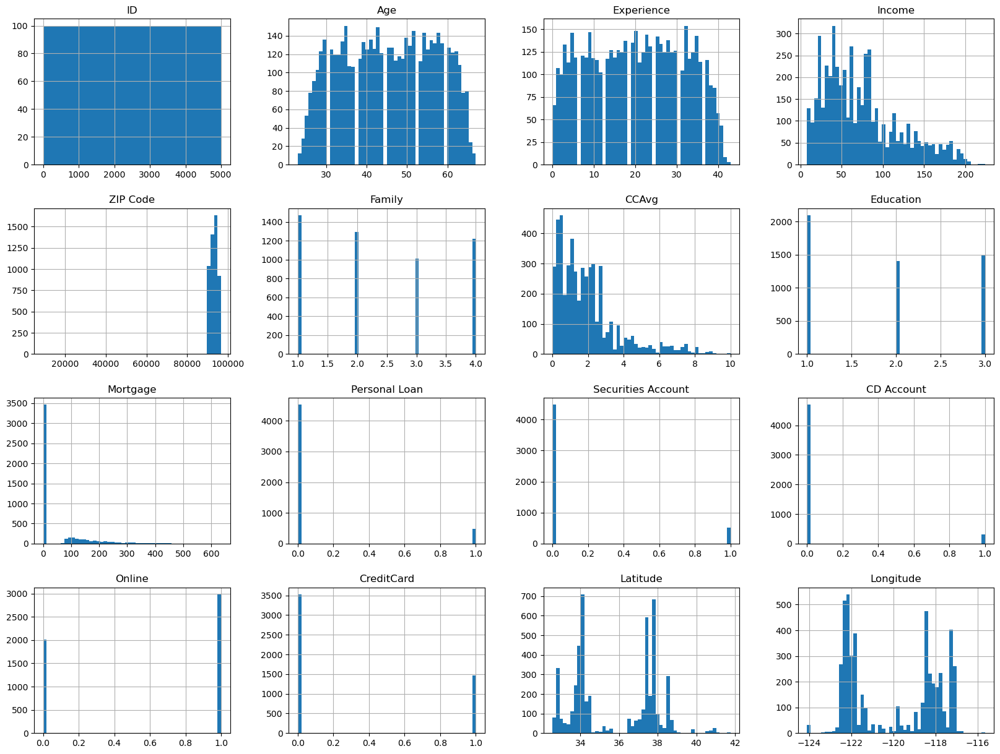

In [25]:
df.hist(bins=50,figsize=(20,15))    # hist for checking distribution
plt.show()

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">We can have a general view and know which columns are discrete and which one are continuous.</div>

<function matplotlib.pyplot.show(close=None, block=None)>

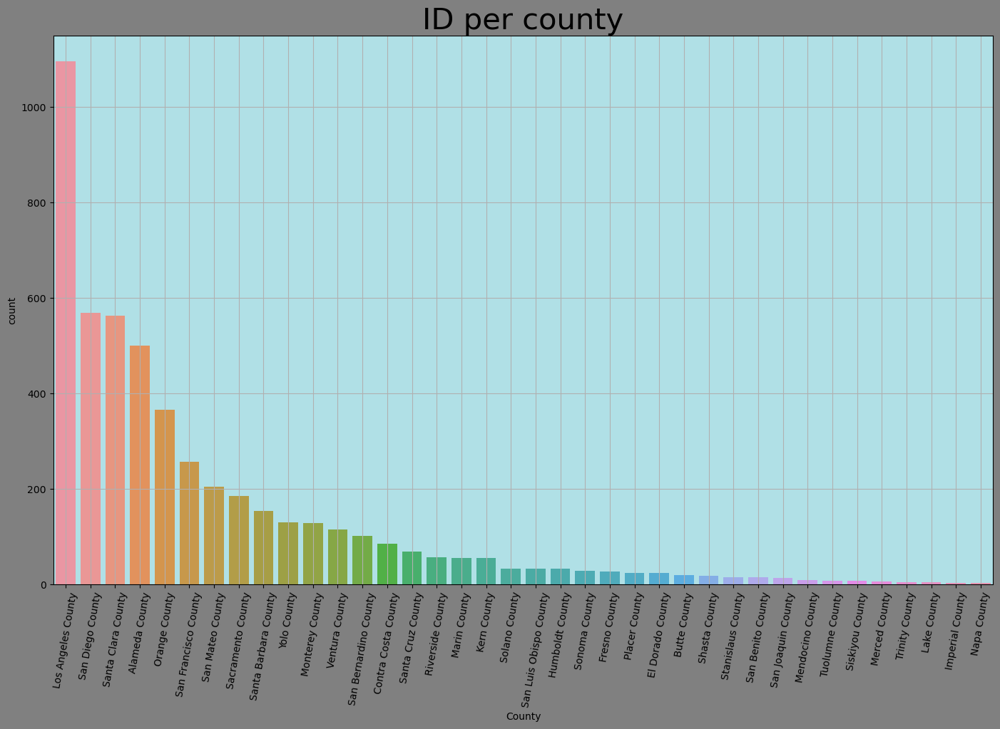

In [26]:
fig = plt.figure(figsize = (17, 10), facecolor='gray')  
counts_order = df['County'].value_counts().index
sns.countplot (df["County"] , order = counts_order )
plt.title ("ID per county", fontsize=30)
plt.xticks (rotation = 80)
plt.grid ()
plt.gca().set_facecolor('powderblue')
plt.show

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">This bar plot shows the number of customers in each county. (descending order).</div>

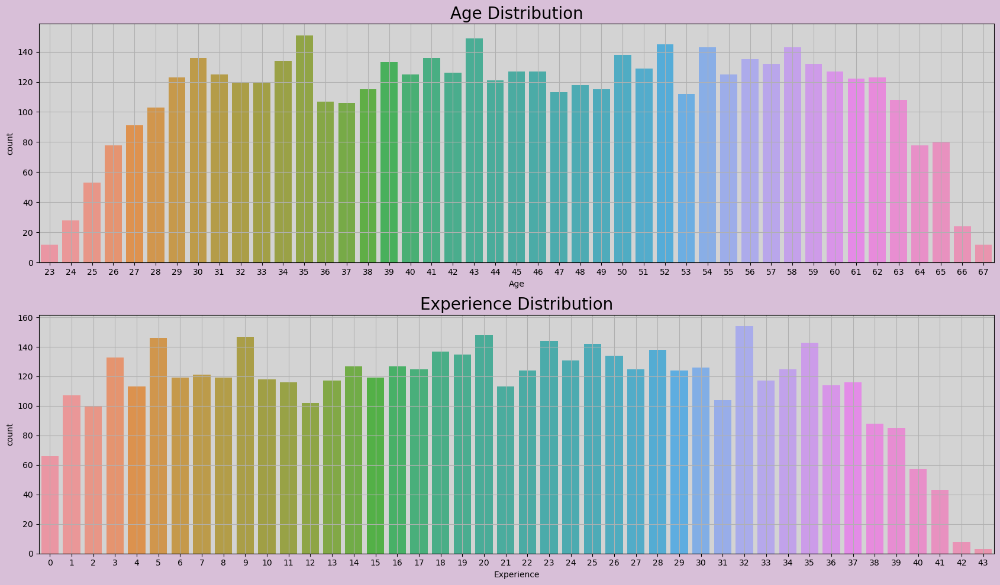

In [27]:
fig = plt.figure(figsize = (17, 10), facecolor='thistle')

plt.subplot(2, 1, 1)
sns.countplot(x= df['Age'])
plt.title('Age Distribution', fontsize=20)  
plt.xlabel('Age') 
plt.grid ()
plt.gca().set_facecolor('lightgray')

plt.subplot(2, 1, 2)
sns.countplot(x= df['Experience'])
plt.title('Experience Distribution', fontsize=20) 
plt.xlabel('Experience') 
plt.grid ()
plt.gca().set_facecolor('lightgray')

plt.tight_layout()
plt.show()

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">distribution of two continuous variables which have somehow same behavore.</div>

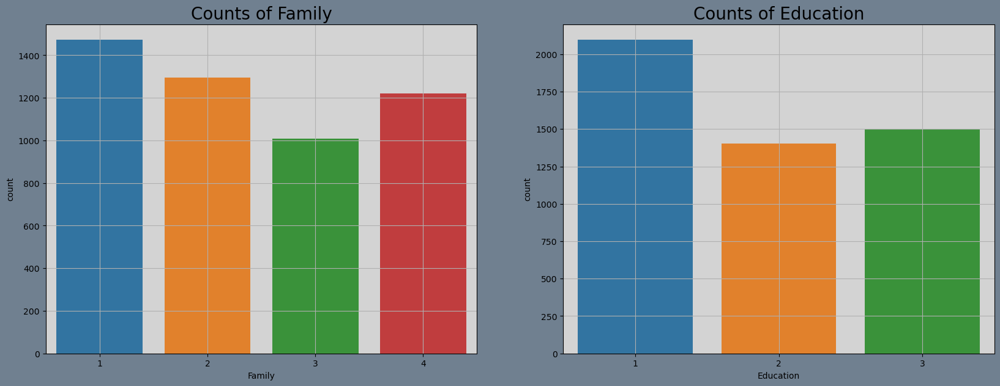

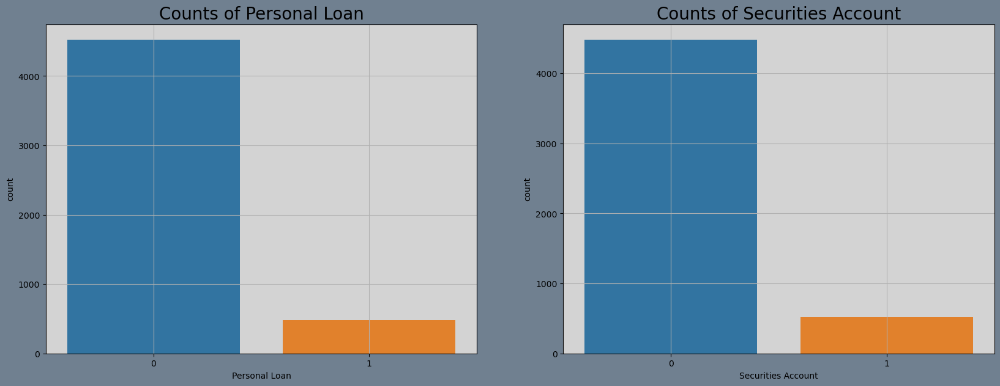

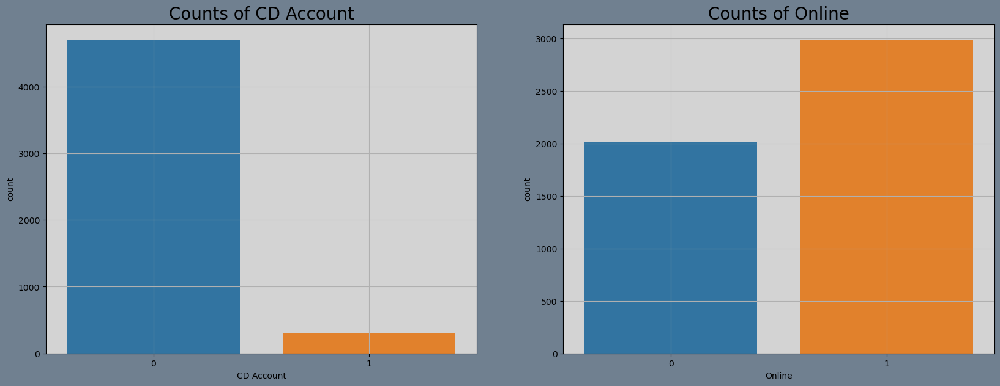

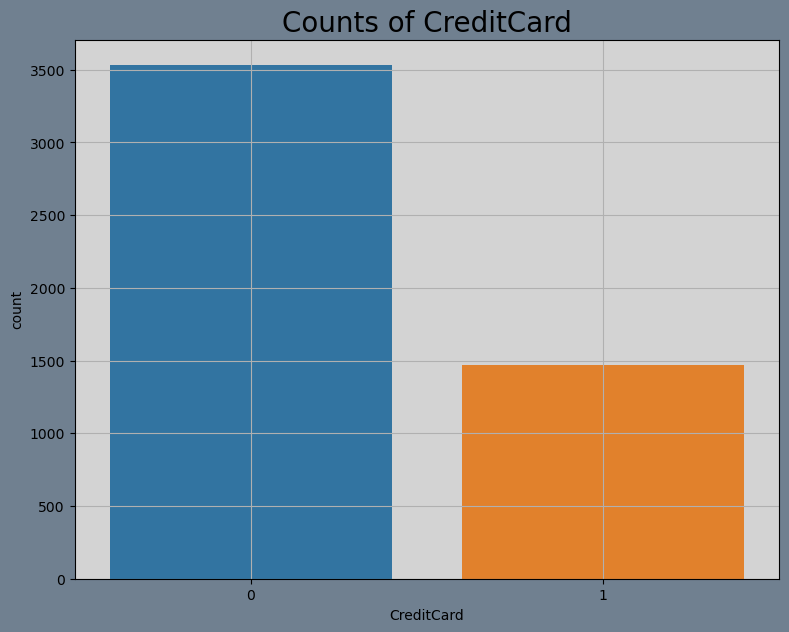

In [28]:
count_plot_columns = list (df [['Family' , 'Education' , 'Personal Loan' , 'Securities Account' , 'CD Account' , 'Online' , 'CreditCard']])
i =  0

while i < len(count_plot_columns):
    fig = plt.figure(figsize = (20, 7), facecolor='slategray')
    
    plt.subplot(1, 2, 1)
    sns.countplot(x=count_plot_columns[i], data=df)
    plt.title(f'Counts of {count_plot_columns[i]}', fontsize=20)  
    plt.grid ()
    plt.gca().set_facecolor('lightgray')
    i += 1

    if i < len(count_plot_columns):
        plt.subplot(1, 2, 2)
        sns.countplot(x=count_plot_columns[i], data=df)
        plt.title(f'Counts of {count_plot_columns[i]}', fontsize=20) 
        plt.grid ()
        plt.gca().set_facecolor('lightgray')
        i += 1

    plt.show()

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">And here we have bar plot of columns. </div>

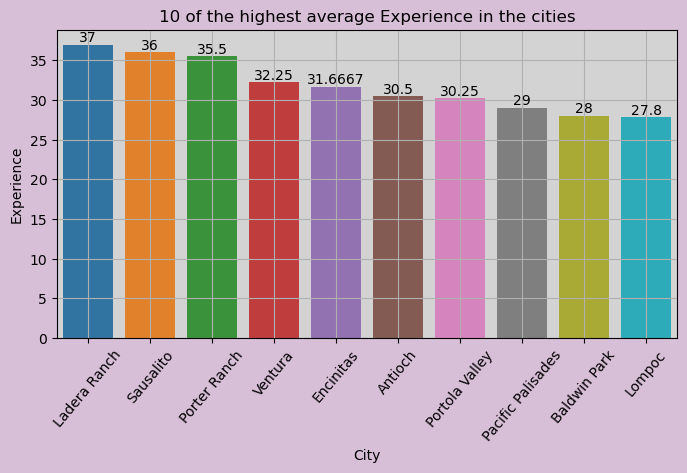

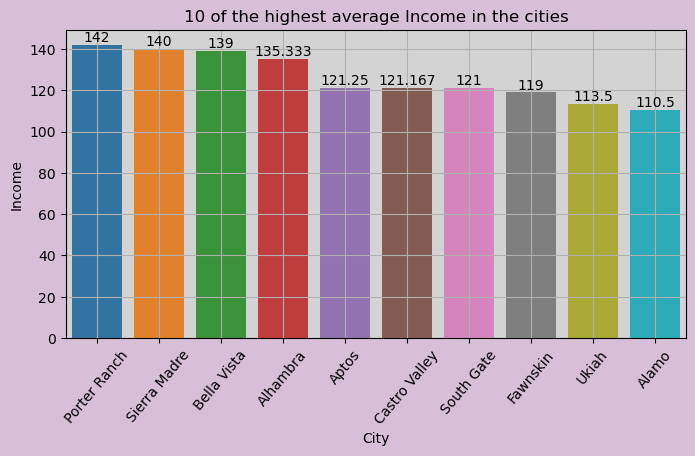

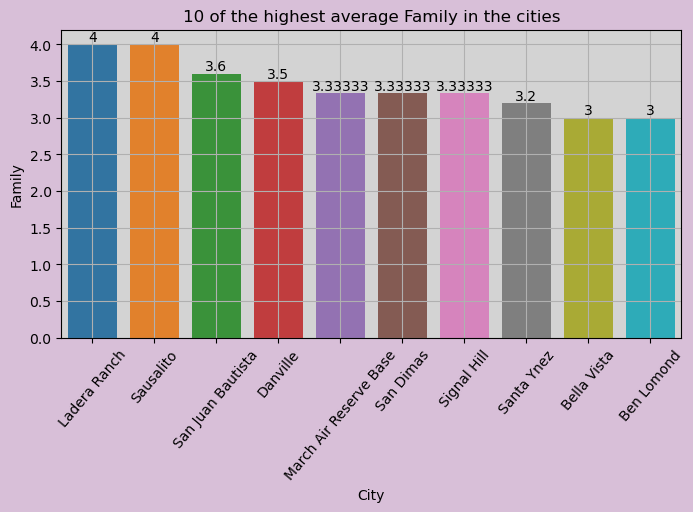

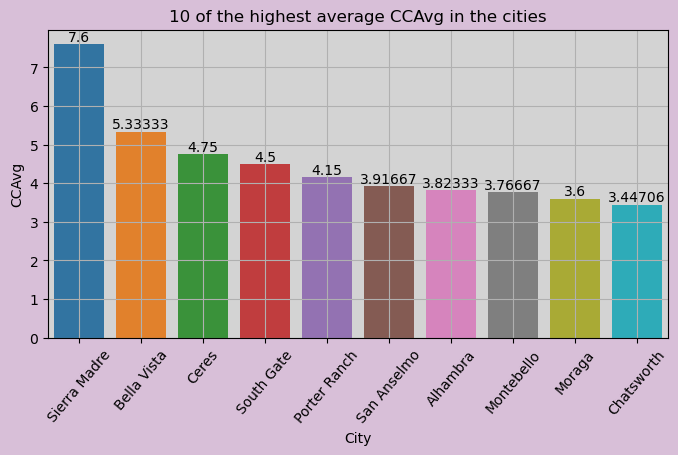

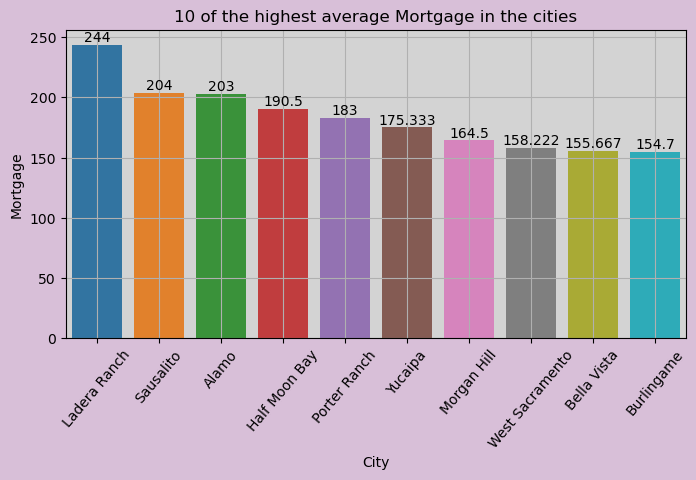

In [29]:
df_bar = df[["Experience", "Income", "Family" , "CCAvg" , "Mortgage"]]
for col in df_bar.columns:
        fig = plt.figure(figsize = (8, 4), facecolor='thistle')
        df_gb = df.groupby(['City'])[col].mean().nlargest(10).reset_index().sort_values(col , ascending = False)
        ax = sns.barplot (x = "City" , y = col , data = df_gb)
        for label in ax.containers:
            ax.bar_label(label)
        plt.title ("10 of the highest average " + col + " in the cities")
        plt.grid ()
        plt.gca().set_facecolor('lightgray')
        plt.xticks (rotation = 50)
        plt.show ()

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">These bar plots shows top 10 city based on column averages. </div>

In [30]:
# plotting mean of columns in counties
df_gb = df.groupby(['County', 'Personal Loan']).mean().reset_index()
df_gb2 = df_gb [['Age', 'Experience', 'Income','Family', 'CCAvg','Education', 'Mortgage',]]

# Creating group barplots for each numeric column
for column in df_gb2:
    fig = go.Figure()

        # Adding barplot for Personal Loan = 0
    fig.add_trace(go.Bar(
        x=df_gb[df_gb['Personal Loan'] == 0]['County'],
        y=df_gb[df_gb['Personal Loan'] == 0][column],
        name='Personal Loan = 0',
        marker_color='#1f77b4'
    ))

        # Adding barplot for Personal Loan = 1
    fig.add_trace(go.Bar(
         x=df_gb[df_gb['Personal Loan'] == 1]['County'],
         y=df_gb[df_gb['Personal Loan'] == 1][column],
         name='Personal Loan = 1',
         marker_color='#ff7f0e'
        ))

        # Add a title, change paper background color, add a grid, and modify layout
    fig.update_layout(
        title_text=f"Mean {column} per County and Personal Loan",
        paper_bgcolor="rgba(159, 155, 202, 0.8)",  
        font=dict(size=16),
        barmode='group', 
        xaxis_tickangle=-90
    )

    fig.update_yaxes(showgrid=True)
    fig.update_xaxes(
        showgrid=True,
        ticklen=10,
        tickfont=dict(
            family='Arial, sans-serif',
            size=8,
            color='black'
        )
    )

    fig.show()

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">Also these bar plots shows mean of columns per counties which is separated by personal loan values.  </div>

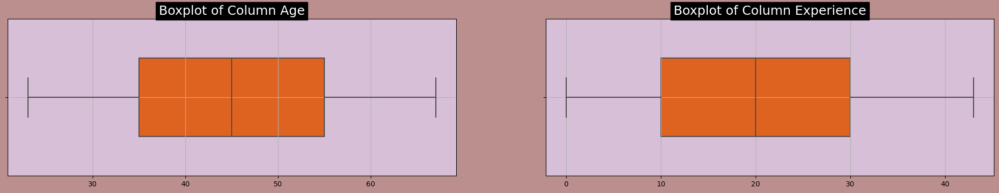

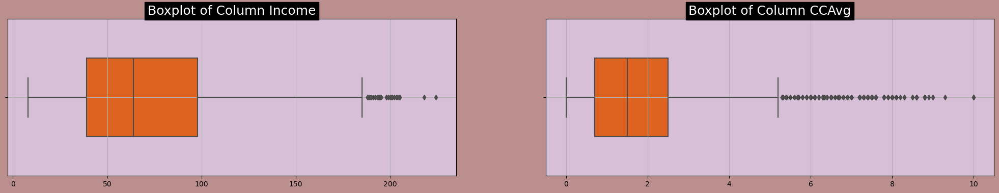

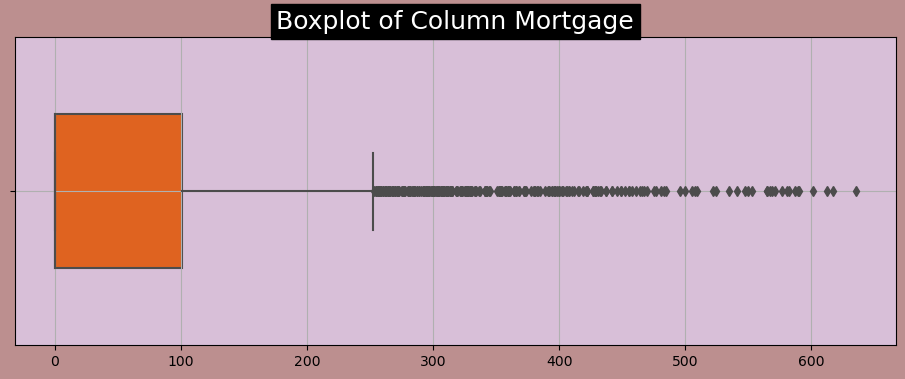

In [31]:
df_box = df[["Age", "Experience", "Income" , "CCAvg" , "Mortgage"]].columns
i =  0
while i < len(df_box):
    fig = plt.figure(figsize = (25, 4), facecolor='RosyBrown')
    
    plt.subplot (1 , 2 , 1)
    box = sns.boxplot(x=df_box [i], data=df, palette="hot_r", width=0.5, dodge=True )
    box.set_title("Boxplot of Column " + df_box [i] , fontsize=18 , backgroundcolor = 'black',color='white')
    box.set(xlabel=None)
    box.set_facecolor('thistle')
    plt.grid()
    i += 1

    if i < len(df_box):
        plt.subplot (1 , 2 , 2)
        box = sns.boxplot(x=df_box [i], data=df, palette="hot_r", width=0.5, dodge=True )
        box.set_title("Boxplot of Column " + df_box [i] , fontsize=18 , backgroundcolor = 'black',color='white')
        box.set(xlabel=None)
        box.set_facecolor('thistle')
        plt.grid()
        i += 1

    plt.show()

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">Here are box plots for continuous columns. For their distribution and checking outliers.</div>

In [32]:
# naming Counties that have less than 100 IDs to other
dfcount = df.groupby ("County").size().reset_index() 
dfOther = dfcount [dfcount [0] < 100 ]                 

for col1 in list (dfOther.County):                   
    dfOther = dfOther.replace ([col1] , "other")

dfTop = dfcount [dfcount [0] >= 100 ]                
dfMain = dfTop.append (dfOther)                       
dfMain.rename (columns = {0 : "number of IDs"} , inplace = True) 

In [33]:
ax = px.pie(dfMain, values = "number of IDs", names="County")
ax.update_traces (hole = .4  )
ax.update_layout(title = {
    "text" : "IDs per county" , 
    'y':0.98,  
    'x':0.44,
    'xanchor': 'center',
    'yanchor': 'top'} ,
    font = dict (size = 16) , 
    margin = dict(l = 45 , r = 45 , t = 45 , b = 45),
    paper_bgcolor = "LightSteelBlue")

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">A pie plot which shows the percentage of customers per counties which have atleast over 100 costumers. </div>

In [34]:
# 4 counties which have more registered IDs
dfTop = df[df["County"].isin(['Los Angeles County', 'San Diego County', 'Santa Clara County', 'Alameda County'])]
ax = px.sunburst(dfTop,
                  path=['County', 'City']
                 )
ax.update_layout(title = {
    "text" : "Cities and counties that have many registered IDs" , 
    'y':0.98,  
    'x':0.5,
    'xanchor': 'center',
    'yanchor': 'top'} ,
    font = dict (size = 16) , 
    margin=dict(l=45, r=45, t=45, b=45),
    paper_bgcolor="LightSteelBlue",
                )
ax.show()

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">This plot includes 4 counties wich have the most IDs and it visualized their cities too. </div>

<AxesSubplot:>

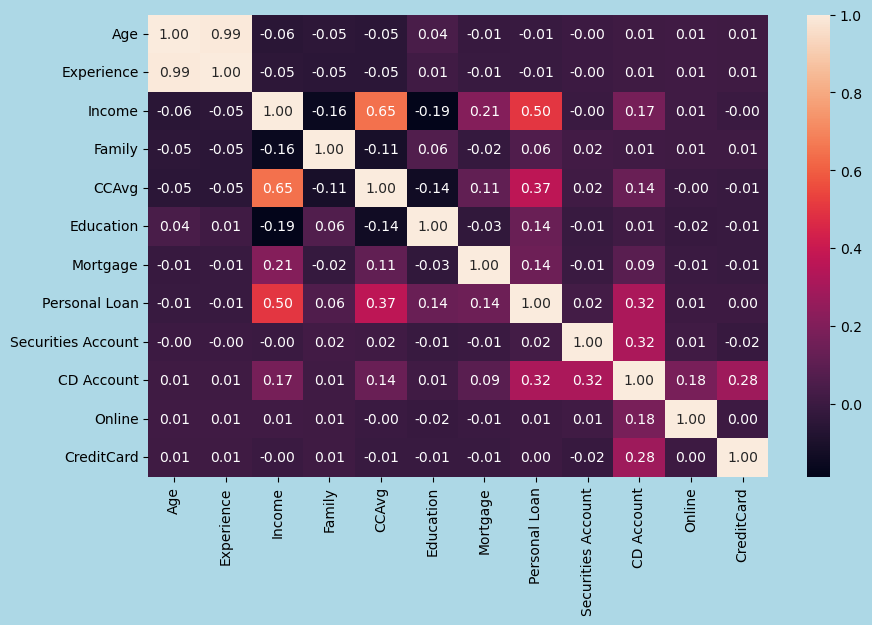

In [35]:
dfheat = df.drop (["ID" , 'ZIP Code' , 'Latitude' , 'Longitude' , 'County' , 'City'] , axis = 1)
fig = plt.figure(figsize = (10, 6), facecolor='lightblue')
sns.heatmap(dfheat.corr() , annot=True , fmt=".2f")

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">A heat map that shows the correlation btw features to the other and to the target. The most eye catching relation is related to age and experience column with 0.99 correlation.
</div>

In [36]:
# defining a function for 3D plots
def create_3d_plot(df, x_col, y_col, z_col):
    x_data = df[x_col]
    y_data = df[y_col]
    z_data = df[z_col]
    
    trace = go.Scatter3d (
        x = x_data,
        y = y_data,
        z = z_data,
        mode = 'markers',
        marker = dict(
            color = z_data,
            colorscale = 'Bluered_r', 
            cmin=0,
            cmax=1,
            colorbar = dict(thickness=10, title=z_col, len=0.8, tickvals=[0,1], ticktext=['0', '1']), 
            line = dict(color = 'rgb(255, 255, 255)'),
            opacity = 0.8  
        ),
        hovertext = df.index,   
        hoverinfo = 'text'
    )

    data = [trace]

    layout = go.Layout(
        title = dict(text = '3D Scatter Plot' , y = .95, x = 0.4, xanchor = 'center', yanchor = 'top', font = dict(size=24)),
        scene = dict(
            xaxis_title = x_col,
            yaxis_title = y_col,
            zaxis_title = z_col,
            xaxis=dict(gridcolor='red' , tickfont=dict(color='yellow')),
            yaxis=dict(gridcolor='blue' , tickfont=dict(color='yellow')),
            zaxis=dict(gridcolor='green' , tickfont=dict(color='yellow')),
        ),
        width = 1000, 
        height = 800,
        margin = dict(r = 30, b = 10, l = 10, t = 10),
        paper_bgcolor='lightslategray',
    )

    fig = go.Figure(data = data, layout = layout)
    fig.show()

In [37]:
create_3d_plot (df , 'Income' , 'CCAvg' , 'Personal Loan')

In [38]:
create_3d_plot (df , 'Age' , 'Experience' , 'Personal Loan')

In [39]:
create_3d_plot (df , 'Income' , 'Mortgage' , 'Personal Loan')

In [40]:
create_3d_plot (df , 'CCAvg' , 'Mortgage' , 'Personal Loan')

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">Here we have four 3D plots of 2 different features and the target 'personal loan'. They show the ralation of 2 feature with classification of personal loan values.</div>

In [41]:
# Count the unique IDs per County
df['count'] = df.groupby('County')['ID'].transform('count')  

map_fig = px.scatter_mapbox(df,
                            lat="Latitude",
                            lon="Longitude",
                            hover_name="City",
                            hover_data=["County", "count"],
                            color_discrete_sequence=["fuchsia"],
                            zoom=3,
                            height=300)

map_fig.update_layout(mapbox_style="open-street-map")
map_fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
map_fig.show()

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">This scatter map shows the counties and the count of IDs in them. </div>

In [42]:
fig = px.scatter_mapbox(df, lat='Latitude', lon='Longitude', hover_name='ID',
                        hover_data=["County", "City" , "ID"],zoom=5,
                        mapbox_style="open-street-map")
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">Also this scatter map shows the exact location of IDs and their cities</div>

# <div style="padding: 10px; background-color: Thistle; margin: 0; color: Teal; font-family: cursive, serif; font-size: 120%; text-align: center; border-radius: 50% 20% / 10% 40%;; overflow: hidden; font-weight: 500;">Models</div>

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">The dataset now is ready for training. In this section i tried 3 algorithms such as logistic regression, naive bayes and KNN</div>

In [43]:
df.columns

Index(['ID', 'Age', 'Experience', 'Income', 'ZIP Code', 'Family', 'CCAvg',
       'Education', 'Mortgage', 'Personal Loan', 'Securities Account',
       'CD Account', 'Online', 'CreditCard', 'City', 'Latitude', 'Longitude',
       'County', 'count'],
      dtype='object')

In [44]:
df.drop (['ID', 'ZIP Code'  , 'City', 'Latitude', 'Longitude','County', 'count' ] , axis  = 1 , inplace = True)

# <div style="padding: 10px; background-color: Thistle; margin: 0; color: Teal; font-family: cursive, serif; font-size: 120%; text-align: center; border-radius: 50% 20% / 10% 40%;; overflow: hidden; font-weight: 500;">Logistic regression</div>

In [45]:
## first model
# feature selection 
x = df.drop ("Personal Loan" , axis = 1)
y = df ["Personal Loan"].values.reshape (-1 , 1)

# scaling
Scaler = StandardScaler ()
x_norm = Scaler.fit_transform (x)

# train & test
x_train , x_test , y_train , y_test = train_test_split (x_norm , y , test_size = .2 , random_state = 0)

# model 
logreg1 = LogisticRegression (solver = "liblinear")
# train & predict
logreg1.fit (x_train , y_train.ravel())
y_pred = logreg1.predict (x_test)
# score
print ("Accuracy : " , metrics.accuracy_score (y_test , y_pred))

Accuracy :  0.96


<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">I got a nice score. lets go for checking differernt test sizes</div>

In [46]:
## checking test size
accuracy_df = pd.DataFrame(columns=['Test Size', 'Accuracy'])
for i in np.arange(.10, .35, .01):
    x = df.drop ("Personal Loan" , axis = 1)
    y = df ["Personal Loan"].values.reshape (-1 , 1)

    Scaler = StandardScaler ()
    x_norm = Scaler.fit_transform (x)

    x_train , x_test , y_train , y_test = train_test_split (x_norm , y , test_size = round(i, 2) , random_state = 0)

    logreg2 = LogisticRegression (solver = "liblinear")

    logreg2.fit (x_train , y_train.ravel())
    y_pred = logreg2.predict (x_test)

    accuracy_score = metrics.accuracy_score (y_test , y_pred)
    accuracy_df = accuracy_df.append({'Test Size': round(i, 2), 'Accuracy': accuracy_score}, ignore_index=True)

In [47]:
top3_accuracy = accuracy_df.nlargest(3, 'Accuracy') 
top3_accuracy

,Test Size,Accuracy
0,0.10,0.964000
5,0.15,0.962667
6,0.16,0.962500


<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">test size .1 and .15 have highest accuracy but lets check their performance. </div>

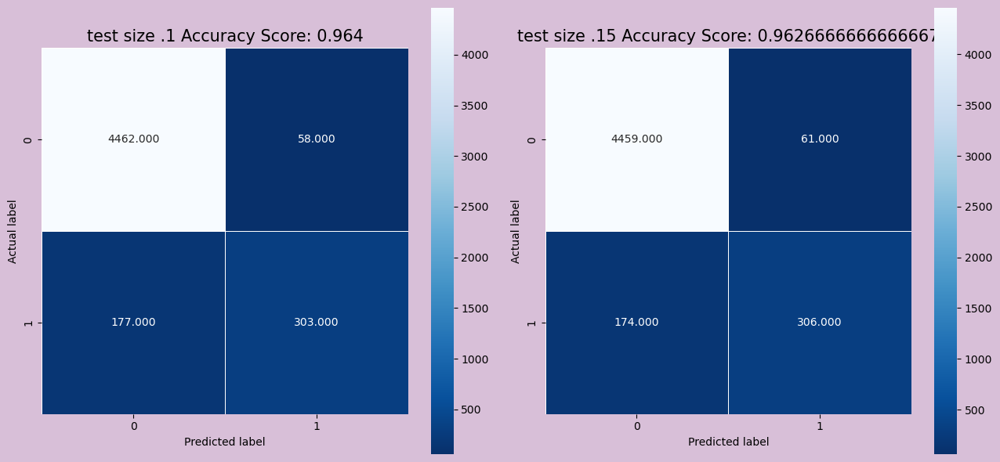

In [48]:
# checking 2 highest scores
x = df.drop ("Personal Loan" , axis = 1)
y = df ["Personal Loan"].values.reshape (-1 , 1)

Scaler = StandardScaler ()
x_norm = Scaler.fit_transform (x)

x_train , x_test , y_train , y_test = train_test_split (x_norm , y , test_size = .1 , random_state = 0)
logreg1 = LogisticRegression (solver = "liblinear")
logreg1.fit (x_train , y_train.ravel())
y_pred = logreg1.predict (x_test)
cm1 = confusion_matrix (y , logreg1.predict (x_norm))
score1 = logreg1.score(x_test, y_test)

x_train , x_test , y_train , y_test = train_test_split (x_norm , y , test_size = .15 , random_state = 0)
logreg2 = LogisticRegression (solver = "liblinear")
logreg2.fit (x_train , y_train.ravel())
y_pred = logreg2.predict (x_test)
cm2 = confusion_matrix (y , logreg2.predict (x_norm))
score2 = logreg2.score(x_test, y_test)


fig = plt.figure(figsize = (13, 6), facecolor='thistle')

plt.subplot(1, 2, 1)
sns.heatmap(cm1, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = 'test size .1 Accuracy Score: {0}'.format(score1)
plt.title(all_sample_title, size = 15)

plt.subplot(1, 2, 2)
sns.heatmap(cm2, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = 'test size .15 Accuracy Score: {0}'.format(score2)
plt.title(all_sample_title, size = 15)

plt.tight_layout()
plt.show()

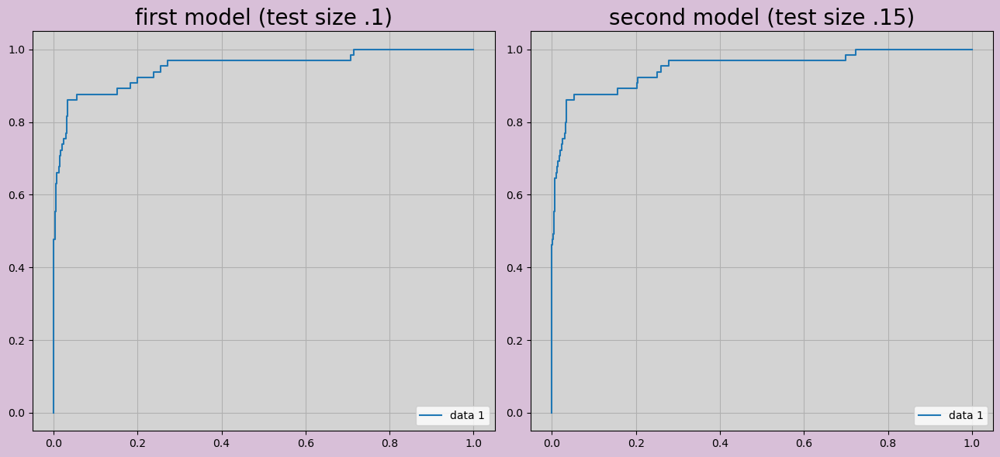

In [49]:
fig = plt.figure(figsize = (13, 6), facecolor='thistle')

plt.subplot(1, 2, 1)
y_pred_proba = logreg1.predict_proba (x_test) [:: , 1]
fpr , tpr , _ = metrics.roc_curve (y_test , y_pred_proba)
plt.plot (fpr , tpr , label = "data 1")
plt.legend (loc = 4)
plt.grid ()
plt.title('first model (test size .1)', fontsize=20) 
plt.gca().set_facecolor('lightgray')

plt.subplot(1, 2, 2)
y_pred_proba = logreg2.predict_proba (x_test) [:: , 1]
fpr , tpr , _ = metrics.roc_curve (y_test , y_pred_proba)
plt.plot (fpr , tpr , label = "data 1")
plt.legend (loc = 4)
plt.grid ()
plt.title('second model (test size .15)', fontsize=20) 
plt.gca().set_facecolor('lightgray')

plt.tight_layout()
plt.show()

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">Test size 0.15 is better for value '1' prediction and value '1' is more important for us so i use test size .15</div>

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">Next step is checking logistic regression optimization parameters for fine tuning with gridsearchCV</div>

In [50]:
x = df.drop ("Personal Loan" , axis = 1)
y = df ["Personal Loan"].values.reshape (-1 , 1)

Scaler = StandardScaler ()
x_norm = Scaler.fit_transform (x)

x_train , x_test , y_train , y_test = train_test_split (x_norm , y , test_size = .15 , random_state = 0)

In [51]:
#we can put many other parameters and their values
param_grid = {'solver':['liblinear', 'saga'] ,
              'C' : range (1 , 10) ,
             'penalty':['l2' , 'l1'] , 
              'max_iter' : range (90 , 110 , 5)
             }  

logreg5 = LogisticRegression ()
clf = GridSearchCV (logreg5 , param_grid , cv = 5 , n_jobs = -1)

clf.fit(x_train , y_train.ravel ())

GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': range(1, 10), 'max_iter': range(90, 110, 5),
                         'penalty': ['l2', 'l1'],
                         'solver': ['liblinear', 'saga']})

In [52]:
print(clf.best_params_)              # best param values
print(clf.best_score_)              # best score with different values

{'C': 2, 'max_iter': 90, 'penalty': 'l2', 'solver': 'liblinear'}
0.9508235294117646


<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">In this way i got even lower score! so i don't use these params at all</div>

In [53]:
## logistic regression with best parameters
x = df.drop ("Personal Loan" , axis = 1)
y = df ["Personal Loan"].values.reshape (-1 , 1)

Scaler = StandardScaler ()
x_norm = Scaler.fit_transform (x)

x_train , x_test , y_train , y_test = train_test_split (x_norm , y , test_size = .15 , random_state = 0)

logreg4 = LogisticRegression (solver = "liblinear" , penalty = 'l2')

logreg4.fit (x_train , y_train.ravel())
y_pred = logreg4.predict (x_test)

print ("Accuracy : ", metrics.accuracy_score (y_test , y_pred))

Accuracy :  0.9626666666666667


In [54]:
# cross validation checking 
kfold_validation = KFold (10)
result = cross_val_score (logreg4 , x , y , cv = kfold_validation)
print (result)
print (np.mean(result))

[0.95  0.944 0.948 0.94  0.952 0.95  0.956 0.942 0.964 0.95 ]
0.9495999999999999


In [55]:
# checking loss functions 
print ( classification_report ( y , logreg4.predict (x_norm)))

              precision    recall  f1-score   support

           0       0.96      0.99      0.97      4520
           1       0.83      0.64      0.72       480

    accuracy                           0.95      5000
   macro avg       0.90      0.81      0.85      5000
weighted avg       0.95      0.95      0.95      5000



<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">I got good scores and my final accuracy score with logistic regression is => 0.9626666666666667</div>

# <div style="padding: 10px; background-color: Thistle; margin: 0; color: Teal; font-family: cursive, serif; font-size: 120%; text-align: center; border-radius: 50% 20% / 10% 40%;; overflow: hidden; font-weight: 500;">Naïve Bayes</div>

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">There are several type of naive bayes algorithms. In this section i want to try some of them and compare them for finding the best one.</div>

In [56]:
x = df.drop ("Personal Loan" , axis = 1)
y = df ["Personal Loan"].values.reshape (-1 , 1)

Scaler = StandardScaler ()
x_norm = Scaler.fit_transform (x)

x_train , x_test , y_train , y_test = train_test_split (x_norm , y , test_size = .2 , random_state = 0)

# <div style="padding: 10px; background-color: Thistle; margin: 0; color: Teal; font-family: cursive, serif; font-size: 120%; text-align: center; border-radius: 50% 20% / 10% 40%;; overflow: hidden; font-weight: 500;">GaussianNB</div>

In [57]:
## checking test size
accuracy_df = pd.DataFrame(columns=['Test Size', 'Accuracy'])
for i in np.arange(.10, .35, .01):
    x_train , x_test , y_train , y_test = train_test_split (x_norm , y , test_size = round(i, 2) , random_state = 0)

    NBG = GaussianNB()
    NBG.fit (x_train , y_train.ravel ())
    y_pred = NBG.predict (x_test)   

    accuracy_score = metrics.accuracy_score (y_test , y_pred)
    accuracy_df = accuracy_df.append({'Test Size': round(i, 2), 'Accuracy': accuracy_score}, ignore_index=True)

In [58]:
top3_accuracy = accuracy_df.nlargest(3, 'Accuracy') 
top3_accuracy

,Test Size,Accuracy
15,0.25,0.894400
13,0.23,0.893913
14,0.24,0.893333


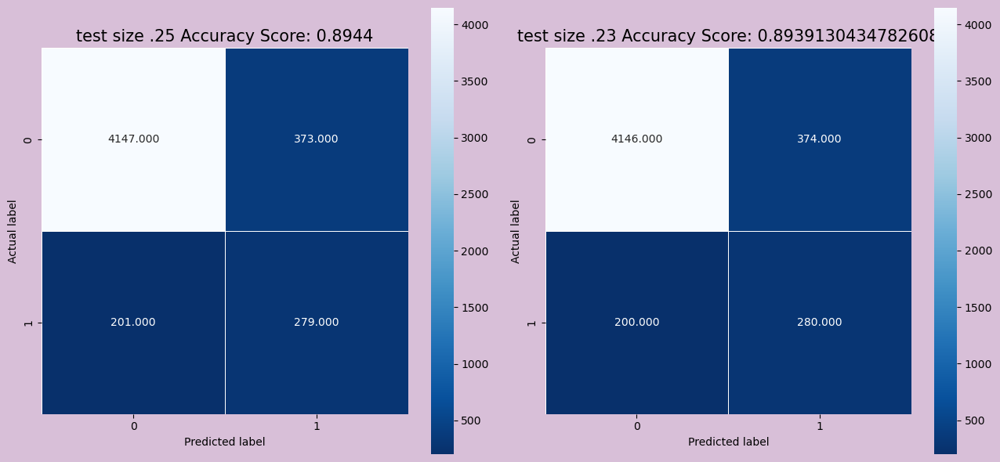

In [59]:
# checking 2 highest scores
x_train , x_test , y_train , y_test = train_test_split (x_norm , y , test_size = .25 , random_state = 0)
NBG1 = GaussianNB()
NBG1.fit (x_train , y_train.ravel ())
y_pred = NBG1.predict (x_test) 
cm1 = confusion_matrix (y , NBG1.predict (x_norm))
score1 = NBG1.score(x_test, y_test)

x_train , x_test , y_train , y_test = train_test_split (x_norm , y , test_size = .23 , random_state = 0)
NBG2 = GaussianNB()
NBG2.fit (x_train , y_train.ravel ())
y_pred = NBG2.predict (x_test) 
cm2 = confusion_matrix (y , NBG2.predict (x_norm))
score2 = NBG2.score(x_test, y_test)


fig = plt.figure(figsize = (13, 6), facecolor='thistle')

plt.subplot(1, 2, 1)
sns.heatmap(cm1, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = 'test size .25 Accuracy Score: {0}'.format(score1)
plt.title(all_sample_title, size = 15)

plt.subplot(1, 2, 2)
sns.heatmap(cm2, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = 'test size .23 Accuracy Score: {0}'.format(score2)
plt.title(all_sample_title, size = 15)

plt.tight_layout()
plt.show()

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">There isn't many differences btw these two test sizes and i choose .25 for this algorithm</div>

In [60]:
# cross validation check 
kfold_validation = KFold (10)
result = cross_val_score (NBG1 , x , y.ravel() , cv = kfold_validation)
print (result)
print (np.mean(result))

[0.894 0.856 0.892 0.872 0.892 0.886 0.888 0.88  0.878 0.894]
0.8832000000000001


# <div style="padding: 10px; background-color: Thistle; margin: 0; color: Teal; font-family: cursive, serif; font-size: 120%; text-align: center; border-radius: 50% 20% / 10% 40%;; overflow: hidden; font-weight: 500;">ComplementNB</div>

In [61]:
## checking test size
accuracy_df = pd.DataFrame(columns=['Test Size', 'Accuracy'])
for i in np.arange(.10, .35, .01):
    x_train , x_test , y_train , y_test = train_test_split (x , y , test_size = round(i, 2) , random_state = 0)

    NBC = ComplementNB ()
    NBC.fit (x_train , y_train.ravel ())
    y_pred = NBC.predict (x_test)   

    accuracy_score = metrics.accuracy_score (y_test , y_pred)
    accuracy_df = accuracy_df.append({'Test Size': round(i, 2), 'Accuracy': accuracy_score}, ignore_index=True)

In [62]:
max (accuracy_df.Accuracy)  # low score

0.7516666666666667

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">This kind of NB doesn't fit our data well. </div>

# <div style="padding: 10px; background-color: Thistle; margin: 0; color: Teal; font-family: cursive, serif; font-size: 120%; text-align: center; border-radius: 50% 20% / 10% 40%;; overflow: hidden; font-weight: 500;">MultinomialNB</div>

In [63]:
## checking test size
accuracy_df = pd.DataFrame(columns=['Test Size', 'Accuracy'])
for i in np.arange(.10, .35, .01):
    x_train , x_test , y_train , y_test = train_test_split (x , y , test_size = round(i, 2) , random_state = 0)

    NBM = MultinomialNB ()
    NBM.fit (x_train , y_train.ravel ())
    y_pred = NBM.predict (x_test)   

    accuracy_score = metrics.accuracy_score (y_test , y_pred)
    accuracy_df = accuracy_df.append({'Test Size': round(i, 2), 'Accuracy': accuracy_score}, ignore_index=True)

In [64]:
max (accuracy_df.Accuracy)

0.7733333333333333

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">Also MultinomialNB doesn't fit our data well.</div>

# <div style="padding: 10px; background-color: Thistle; margin: 0; color: Teal; font-family: cursive, serif; font-size: 120%; text-align: center; border-radius: 50% 20% / 10% 40%;; overflow: hidden; font-weight: 500;">BernoulliNB</div>

In [65]:
## checking test size
accuracy_df = pd.DataFrame(columns=['Test Size', 'Accuracy'])
for i in np.arange(.10, .35, .01):
    x_train , x_test , y_train , y_test = train_test_split (x_norm , y , test_size = round(i, 2) , random_state = 0)

    NBB = BernoulliNB ()
    NBB.fit (x_train , y_train.ravel ())
    y_pred = NBB.predict (x_test)   

    accuracy_score = metrics.accuracy_score (y_test , y_pred)
    accuracy_df = accuracy_df.append({'Test Size': round(i, 2), 'Accuracy': accuracy_score}, ignore_index=True)

In [66]:
top3_accuracy = accuracy_df.nlargest(3, 'Accuracy') 
top3_accuracy

,Test Size,Accuracy
0,0.10,0.932000
7,0.17,0.931845
1,0.11,0.930909


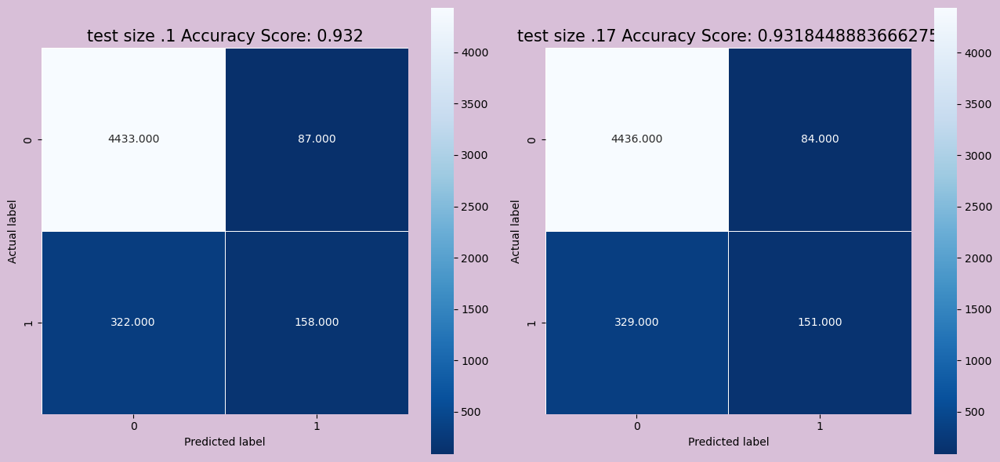

In [67]:
# checking 2 highest scores
x_train , x_test , y_train , y_test = train_test_split (x_norm , y , test_size = .1 , random_state = 0)
NBB1 = BernoulliNB ()
NBB1.fit (x_train , y_train.ravel ())
y_pred = NBB1.predict (x_test) 
cm1 = confusion_matrix (y , NBB1.predict (x_norm))
score1 = NBB1.score(x_test, y_test)

x_train , x_test , y_train , y_test = train_test_split (x_norm , y , test_size = .17 , random_state = 0)
NBB2 = BernoulliNB ()
NBB2.fit (x_train , y_train.ravel ())
y_pred = NBB2.predict (x_test) 
cm2 = confusion_matrix (y , NBB2.predict (x_norm))
score2 = NBB2.score(x_test, y_test)


fig = plt.figure(figsize = (13, 6), facecolor='thistle')

plt.subplot(1, 2, 1)
sns.heatmap(cm1, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = 'test size .1 Accuracy Score: {0}'.format(score1)
plt.title(all_sample_title, size = 15)

plt.subplot(1, 2, 2)
sns.heatmap(cm2, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = 'test size .17 Accuracy Score: {0}'.format(score2)
plt.title(all_sample_title, size = 15)

plt.tight_layout()
plt.show()

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">test size .1 predicts the 1 values better, also it has better accuracy score. </div>

In [68]:
# cross validation check 
kfold_validation = KFold (10)
result = cross_val_score (NBB1 , x , y.ravel() , cv = kfold_validation)
print (result)
print (np.mean(result))

[0.894 0.886 0.89  0.908 0.884 0.892 0.912 0.89  0.884 0.912]
0.8952000000000002


<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">To summarize, naive bayes algorithms are not very good for this dataset, i test some of them for testing though. and here is the last result:
    <br> - BernoulliNB test size .10 has highest acc in naive bayes algorithms acc = 0.932000
    <br> - GaussianNB test size .25 predicts '1' values very better with lower accuracy
</div>

# <div style="padding: 10px; background-color: Thistle; margin: 0; color: Teal; font-family: cursive, serif; font-size: 120%; text-align: center; border-radius: 50% 20% / 10% 40%;; overflow: hidden; font-weight: 500;">KNN</div>

In [69]:
x = df.drop ("Personal Loan" , axis = 1)
y = df ["Personal Loan"].values.reshape (-1 , 1)

Scaler = StandardScaler ()
x_norm = Scaler.fit_transform (x)

x_train , x_test , y_train , y_test = train_test_split (x_norm , y , test_size = .18 , random_state = 0)

In [70]:
# checking for best test size
accuracy_df = pd.DataFrame(columns=['Test Size', 'Accuracy'])
for i in np.arange(.10, .35, .01):
    x_train , x_test , y_train , y_test = train_test_split (x_norm , y , test_size = round(i, 2) , random_state = 0)

    KNN = KNeighborsClassifier (n_neighbors = 5)
    KNN.fit (x_train , y_train.ravel())
    y_pred = KNN.predict (x_test)   

    accuracy_score = metrics.accuracy_score (y_test , y_pred)
    accuracy_df = accuracy_df.append({'Test Size': round(i, 2), 'Accuracy': accuracy_score}, ignore_index=True)

In [71]:
top3_accuracy = accuracy_df.nlargest(3, 'Accuracy') 
top3_accuracy

,Test Size,Accuracy
8,0.18,0.970000
11,0.21,0.969524
7,0.17,0.969448


<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">Now i should find the best k value for KNN algorithm</div>

In [72]:
K = 20        
acc = np.zeros ((K))
x_train , x_test , y_train , y_test = train_test_split (x_norm , y , test_size = .18 , random_state = 0)

for i in range (1 , K + 1):
    KNN = KNeighborsClassifier (n_neighbors = i)
    KNN.fit (x_train , y_train.ravel())
    y_pred = KNN.predict (x_test)
    acc [i - 1] = metrics.accuracy_score (y_test , y_pred)

acc

array([0.96      , 0.95777778, 0.96777778, 0.96666667, 0.97      ,
       0.96444444, 0.96888889, 0.96111111, 0.96555556, 0.96      ,
       0.96333333, 0.96      , 0.96555556, 0.96111111, 0.96222222,
       0.95777778, 0.95888889, 0.95888889, 0.95888889, 0.95888889])

In [73]:
np.max (acc)

0.97

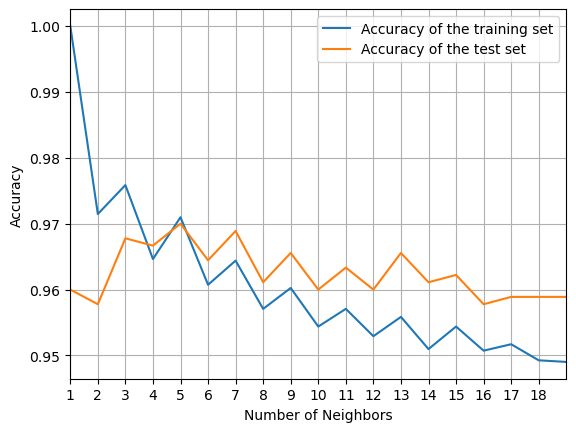

In [74]:
training_acc = []         # plotting for best k value
test_acc = []

neighbors_setting = range (1 , 20)

for n_neighbors in neighbors_setting:
    KNN = KNeighborsClassifier (n_neighbors = n_neighbors)
    KNN.fit (x_train , y_train.ravel())
    training_acc.append (KNN.score (x_train , y_train))
    test_acc.append (KNN.score (x_test , y_test))
    
plt.plot (neighbors_setting , training_acc , label = 'Accuracy of the training set')
plt.plot (neighbors_setting , test_acc , label = 'Accuracy of the test set')
plt.ylabel ('Accuracy')
plt.xlabel ('Number of Neighbors')
plt.xlim (1 , 19)
plt.xticks(np.arange(1, 19, 1))
plt.grid ()
plt.legend ()

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">Test highest acc is related to k = 5 which have minimum distance with training acc</div>

In [75]:
parameters = {'n_neighbors' : range (4 , 30)}      
KNN_grid = KNeighborsClassifier ()

grid_kn = GridSearchCV (estimator  = KNN_grid ,param_grid = parameters , scoring = 'accuracy' , cv = 5)
grid_kn.fit (x_train , y_train.ravel ())

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': range(4, 30)}, scoring='accuracy')

In [76]:
grid_kn.best_params_

{'n_neighbors': 5}

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">By this plot and GridSearchCV method you can easily find best k value which is 5.  </div>

In [77]:
# cross validation
kfold_validation = KFold (10)
result = cross_val_score (KNN , x , y.ravel() , cv = kfold_validation)
print (result)
print (np.mean(result))

[0.91  0.92  0.906 0.894 0.896 0.9   0.908 0.914 0.902 0.92 ]
0.907


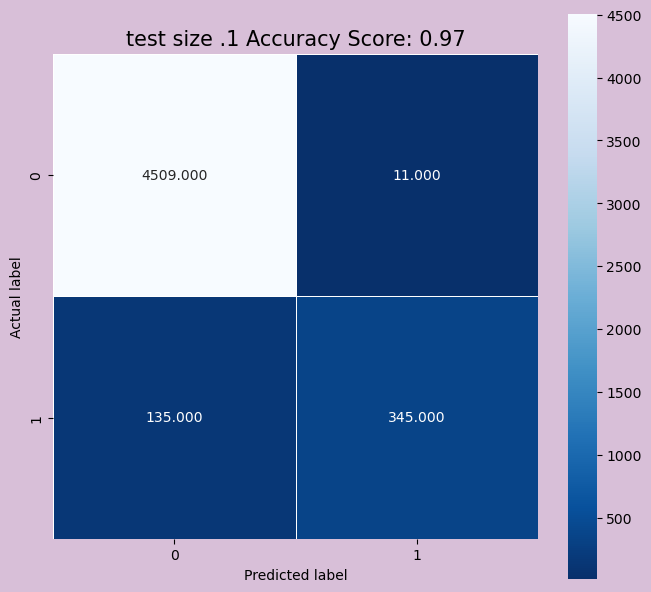

In [78]:
K = 5    
KNN = KNeighborsClassifier (n_neighbors = K)
KNN.fit (x_train , y_train.ravel())
y_pred = KNN.predict (x_test)

cm = confusion_matrix (y , KNN.predict (x_norm))
score = KNN.score(x_test, y_test)

fig = plt.figure(figsize = (13, 6), facecolor='thistle')

plt.subplot(1, 2, 1)
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = 'test size .1 Accuracy Score: {0}'.format(score)
plt.title(all_sample_title, size = 15)

plt.tight_layout()
plt.show()

In [79]:
# checking loss functions 
print ( classification_report ( y , KNN.predict (x_norm)))

              precision    recall  f1-score   support

           0       0.97      1.00      0.98      4520
           1       0.97      0.72      0.83       480

    accuracy                           0.97      5000
   macro avg       0.97      0.86      0.90      5000
weighted avg       0.97      0.97      0.97      5000



<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">And here is the amazing results of knn algorithm. </div>

# <div style="padding: 10px; background-color: Thistle; margin: 0; color: Teal; font-family: cursive, serif; font-size: 120%; text-align: center; border-radius: 50% 20% / 10% 40%;; overflow: hidden; font-weight: 500;">Comparing best models</div>

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">In this section i want to compare all models in one sight. I chose 2 best navive bayeses algorithm among all navive bayeses that i used and two logistic regression and KNN algorithms. </div>

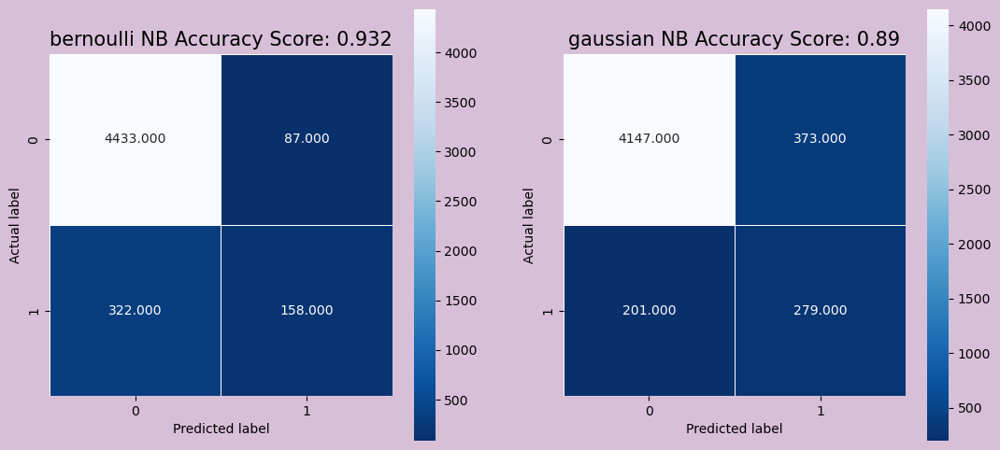

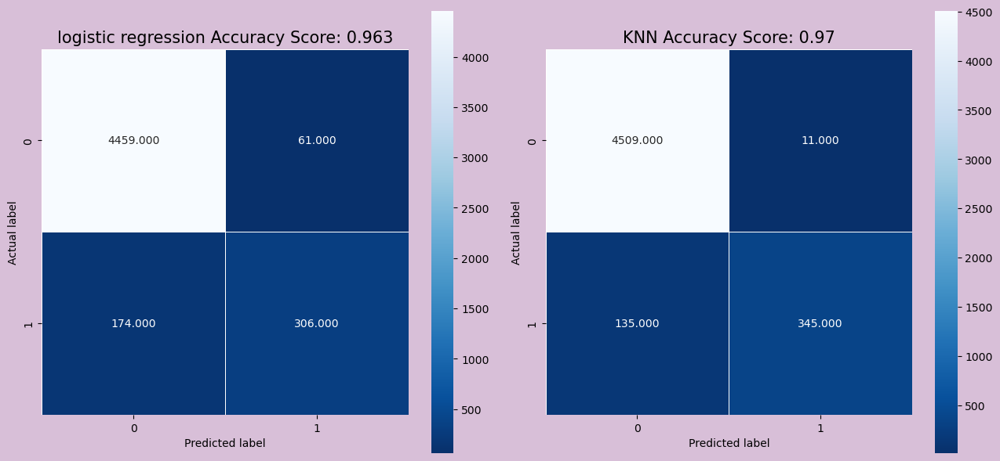

In [80]:
# naive bayes bernoulli
x_train , x_test , y_train , y_test = train_test_split (x_norm , y , test_size = .1 , random_state = 0)
NBB = BernoulliNB ()
NBB.fit (x_train , y_train.ravel ())
y_pred = NBB.predict (x_test) 
cm1 = confusion_matrix (y , NBB.predict (x_norm))
score1 = NBB.score(x_test, y_test)

# naive bayes gaussian
x_train , x_test , y_train , y_test = train_test_split (x_norm , y , test_size = .25 , random_state = 0)
NBG = GaussianNB()
NBG.fit (x_train , y_train.ravel ())
y_pred = NBG.predict (x_test) 
cm2 = confusion_matrix (y , NBG.predict (x_norm))
score2 = NBG.score(x_test, y_test)

# logistic regression
x_train , x_test , y_train , y_test = train_test_split (x_norm , y , test_size = .15 , random_state = 0)
logreg = LogisticRegression (solver = "liblinear")
logreg.fit (x_train , y_train.ravel())
y_pred = logreg.predict (x_test)
cm3 = confusion_matrix (y , logreg.predict (x_norm))
score3 = logreg.score(x_test, y_test)

# KNN
x_train , x_test , y_train , y_test = train_test_split (x_norm , y , test_size = .18 , random_state = 0)
KNN = KNeighborsClassifier (n_neighbors = 5)
KNN.fit (x_train , y_train.ravel())
y_pred = KNN.predict (x_test)
cm4 = confusion_matrix (y , KNN.predict (x_norm))
score4 = KNN.score(x_test, y_test)

fig = plt.figure(figsize = (13, 6), facecolor='thistle')

plt.subplot(1, 2, 1)
sns.heatmap(cm1, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = 'bernoulli NB Accuracy Score: {0}'.format(round (score1 , 3))
plt.title(all_sample_title, size = 15)

plt.subplot(1, 2, 2)
sns.heatmap(cm2, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = 'gaussian NB Accuracy Score: {0}'.format(round (score2 , 2))
plt.title(all_sample_title, size = 15)

fig = plt.figure(figsize = (13, 6), facecolor='thistle')

plt.subplot(1, 2, 1)
sns.heatmap(cm3, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = 'logistic regression Accuracy Score: {0}'.format(round (score3 , 3))
plt.title(all_sample_title, size = 15)

plt.subplot(1, 2, 2)
sns.heatmap(cm4, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = 'KNN Accuracy Score: {0}'.format(round (score4 , 3))
plt.title(all_sample_title, size = 15)

plt.tight_layout()
plt.show()

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">As you can see KNN has better accuracy and its prediction is much better than other algorithm</div>

# <div style="padding: 10px; background-color: Thistle; margin: 0; color: Teal; font-family: cursive, serif; font-size: 120%; text-align: center; border-radius: 50% 20% / 10% 40%;; overflow: hidden; font-weight: 500;">predicting sample</div>

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">I want to predict a sample with this values : 
    <br> - Age = 42
    <br> - Experience = 16
    <br> - Income = 30
    <br> - Family = 3
    <br> - CCAvg = 1.2
    <br> - Education = 3
    <br> - Mortgage = 0
    <br> - Securities Account = 1
    <br> - CD Account = 0
    <br> - Online = 1
    <br> - CreditCard = 1
</div>

In [81]:
# create and transform sample to dataframe
sample = pd.DataFrame ({"Age" : [42] ,
                        "Experience" : [16] ,
                        "Income" : [30] ,
                        "Family" : [3] ,
                        "CCAvg" : [1.2] , 
                        "Education" : [3] ,
                        "Mortgage" : [0] , 
                        "Securities Account" : [1] , 
                        "CD Account" : [0] ,
                        "Online" : [1] , 
                        "CreditCard" : [1]
                       })
sample

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,CreditCard
0,42,16,30,3,1.2,3,0,1,0,1,1


In [82]:
last_df = df.append (sample)
last_df

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,25,1,49,4,1.6,1,0,0.0,1,0,0,0
1,45,19,34,3,1.5,1,0,0.0,1,0,0,0
2,39,15,11,1,1.0,1,0,0.0,0,0,0,0
3,35,9,100,1,2.7,2,0,0.0,0,0,0,0
4,35,8,45,4,1.0,2,0,0.0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4996,30,4,15,4,0.4,1,85,0.0,0,0,1,0
4997,63,39,24,2,0.3,3,0,0.0,0,0,0,0
4998,65,40,49,3,0.5,2,0,0.0,0,0,1,0
4999,28,4,83,3,0.8,1,0,0.0,0,0,1,1


In [83]:
x = last_df.drop ("Personal Loan" , axis = 1)
y = df ["Personal Loan"].values.reshape (-1 , 1)

# scaling
Scaler = StandardScaler ()
x_norm = Scaler.fit_transform (x)

In [84]:
# seprate the main data and sample
x_train = x [:5000]
y_train = y
x_test = x [5000:]

In [85]:
# predicting with KNN
KNN = KNeighborsClassifier (n_neighbors = 5)
KNN.fit (x_train , y_train.ravel())
y_pred = KNN.predict (x_test)
y_pred

array([0], dtype=int64)

In [86]:
# predicting with logistic regression
logreg = LogisticRegression (solver = "liblinear")
logreg.fit (x_train , y_train.ravel())
y_pred = logreg.predict (x_test)
y_pred

array([0], dtype=int64)

In [87]:
# predicting with GaussianNB
NBG = GaussianNB()
NBG.fit (x_train , y_train.ravel ())
y_pred = NBG.predict (x_test) 
y_pred

array([0], dtype=int64)

In [88]:
# predicting with BernoulliNB
NBB = BernoulliNB ()
NBB.fit (x_train , y_train.ravel ())
y_pred = NBB.predict (x_test) 
y_pred

array([0], dtype=int64)

<div style="padding: 10px; margin: 0; color: #4B83C5; font-family: Georgia, serif, serif; font-size: 120%; text-align: center; border-radius: 15px 50px; overflow: hidden; font-weight: 500;">I predict this sample with 4 algorithms and every time i got same prediction. So the '0' value for this sample is suitable. </div>

<div style="padding: 10px; background-color: Thistle; margin: 0; color: Teal; font-family: cursive, serif; font-size: 120%; text-align: center; border-radius: 50% 20% / 10% 40%;; overflow: hidden; font-weight: 500;">Thanks for your time and your attention. wish you best. </div>